In [2]:
!pip install folium

     |████████████████████████████████| 92kB 9.0MB/s eta 0:00:011


In [3]:
import requests as requests
import pandas as pd
# from pandas.io.json import json_normalize

import matplotlib.pyplot as plt

# from sklearn.cluster import KMeans

import folium
# import numpy as np
# import matplotlib.cm as cm
# import matplotlib.colors as colors
# %matplotlib inline

# from sklearn import preprocessing

In [113]:
df = pd.read_html('https://www.worldometers.info/coronavirus/')[0]  # Scrape web page

In [114]:
df.head()

,"Country,Other",TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop
0,China,80824,+11,3189.0,13.0,65573.0,12062,3610.0,56.2
1,Italy,21157,"+3,497",1441.0,175.0,1966.0,17750,1518.0,349.9
2,Iran,12729,"+1,365",611.0,97.0,4339.0,7779,NaN,151.5
3,S. Korea,8086,+107,72.0,5.0,714.0,7300,59.0,157.7
4,Spain,6315,"+1,083",193.0,60.0,517.0,5605,293.0,135.1


In [115]:
df = df[:-1] # remove last row (Total)

In [116]:
df.fillna(0, inplace = True)

In [117]:
df[1:20]

,"Country,Other",TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop
1,Italy,21157,"+3,497",1441.0,175.0,1966.0,17750,1518.0,349.9
2,Iran,12729,"+1,365",611.0,97.0,4339.0,7779,0.0,151.5
3,S. Korea,8086,+107,72.0,5.0,714.0,7300,59.0,157.7
4,Spain,6315,"+1,083",193.0,60.0,517.0,5605,293.0,135.1
5,Germany,4525,+850,8.0,0.0,46.0,4471,9.0,54.0
6,France,4469,+808,91.0,12.0,12.0,4366,154.0,68.5
7,USA,2499,+252,55.0,6.0,49.0,2395,10.0,7.5
8,Switzerland,1375,+236,13.0,2.0,4.0,1358,0.0,158.9
9,UK,1140,+342,21.0,10.0,18.0,1101,20.0,16.8
10,Norway,1077,+81,2.0,1.0,1.0,1074,27.0,198.7


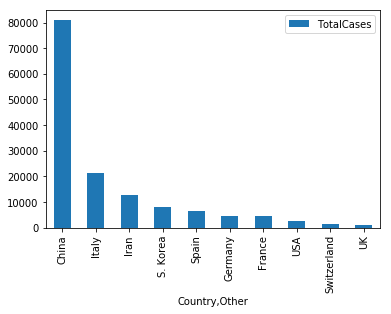

In [120]:
df.head(10).plot.bar("Country,Other","TotalCases")
# df[1:20].plot.bar("Country,Other","TotalCases")

([0, 1, 2, 3, 4, 5, 6, 7, 8], <a list of 9 Text xticklabel objects>)

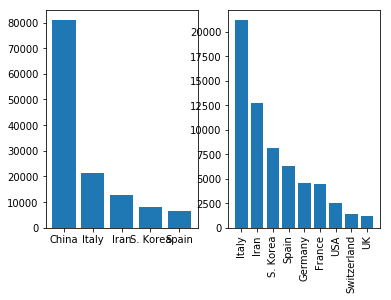

In [119]:
fig, axes = plt.subplots(1,2)
axes[0].bar(df.head()["Country,Other"],df.head()['TotalCases'])
plt.xticks(rotation=90)
axes[1].bar(df[1:10]["Country,Other"],df[1:10]['TotalCases'])
plt.xticks(rotation=90)


## UK

In [122]:
df = pd.read_html('https://www.gov.uk/guidance/coronavirus-covid-19-information-for-the-public#number-of-cases')[0]  # Scrape web page
# df = pd.read_html('https://www.gov.uk/government/publications/coronavirus-covid-19-number-of-cases-in-england/coronavirus-covid-19-number-of-cases-in-england')[0]  # Scrape web page

ValueError: No tables found

In [24]:
df.drop([7, 8], inplace =True)

In [20]:
df.loc[2, 'NHS region']='West Midlands (England)'
df.loc[3, 'NHS region']='Yorkshire and The Humber'
df.loc[4, 'NHS region']='North West (England)'
df.loc[5, 'NHS region']='South East (England)'
df.loc[6, 'NHS region']='South West (England)'

In [25]:
df['NHS region']

0             East of England
1                      London
2     West Midlands (England)
3    Yorkshire and The Humber
4        North West (England)
5        South East (England)
6        South West (England)
Name: NHS region, dtype: object

In [26]:
df.head()

,NHS region,Cases
0,East of England,11
1,London,29
2,West Midlands (England),12
3,Yorkshire and The Humber,13
4,North West (England),21


In [9]:
state_geo = 'http://geoportal1-ons.opendata.arcgis.com/datasets/01fd6b2d7600446d8af768005992f76a_4.geojson'

In [37]:
# code here: https://stackoverflow.com/questions/46775667/plotting-uk-districts-postcode-areas-and-regions
    
m = folium.Map(location=[55, 0], zoom_start=5)
m.choropleth(
    geo_data=state_geo,
    data=df,
    columns=['NHS region', 'Cases'],
    key_on='feature.properties.nuts118nm',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of cases',
    highlight=True
)

m

# Vietnam

In [125]:

import types
import pandas as pd
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.
client_6aeb0e145cd54349a7c35e92f4983a95 = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='zzCCfWHYd_0xNouy8c-wkB7ORIuY1Xr6MYHlN8bI8O5b',
    ibm_auth_endpoint="https://iam.ng.bluemix.net/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url='https://s3-api.us-geo.objectstorage.service.networklayer.com')

body = client_6aeb0e145cd54349a7c35e92f4983a95.get_object(Bucket='coronavirusmap-donotdelete-pr-1ce7xpj3x3arjb',Key='Covid-19_1.xlsx')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )




## Load and clean

In [126]:
df = pd.read_excel(body, skiprows = 1)
df.head()

,Unnamed: 0,Mã số BN,Tuổi,Giới tính,Quốc tịch,Nơi mắc,F,Hạng bay,Chuyến bay,Ngày mắc,Nơi điều trị,Ghi chú,Unnamed: 12,Nơi mắc.1,Unnamed: 14
0,NaN,BN01,66.0,Nam,Trung Quốc,TP.HCM,F0,NaN,NaN,2020-01-22,BV Chợ Rẫy,NaN,NaN,Vĩnh Phúc,11.0
1,NaN,BN02,28.0,Nam,Trung Quốc,TP.HCM,F1,NaN,NaN,2020-01-23,BV Chợ Rẫy,NaN,NaN,Hà Nội,9.0
2,NaN,BN03,25.0,Nữ,Việt Nam,Khánh Hoà,F1,NaN,NaN,2020-02-01,BV Nhiệt đới Khánh Hoà,NaN,NaN,Bình Thuận,9.0
3,NaN,BN04,25.0,Nữ,Việt Nam,Thanh Hoá,F0,NaN,NaN,2020-02-01,BV đa khoa Thanh Hoá,NaN,NaN,TP.HCM,7.0
4,NaN,BN05,29.0,Nam,Việt Nam,Vĩnh Phúc,F0,NaN,NaN,2020-01-30,BV Bệnh nhiệt đới TƯ,NaN,NaN,Quảng Ninh,5.0


In [127]:
df = df.drop(['Unnamed: 0', 'Unnamed: 12', 'Nơi mắc.1', 'Unnamed: 14'], axis = 1)
df.tail()

,Mã số BN,Tuổi,Giới tính,Quốc tịch,Nơi mắc,F,Hạng bay,Chuyến bay,Ngày mắc,Nơi điều trị,Ghi chú
48,BN49,71.0,Nam,Anh,Huế,F1,Thương gia,VN0054,2020-03-14,BV đa khoa TƯ Huế,TX BN30 vợ
49,BN50,50.0,Nam,NaN,Hà Nội,F0,lãnh đạo VNA,NaN,2020-03-14,BV Bệnh nhiệt đới TƯ,Từ Pháp về
50,BN52,22.0,Nữ,NaN,Hà Nội,F0,NaN,NaN,2020-03-14,BV Bệnh nhiệt đới TƯ,NaN
51,BN52,24.0,Nữ,NaN,Quảng Ninh,F0,NaN,NaN,2020-03-14,BV dã chiến Quảng Ninh,NaN
52,BN53,53.0,Nam,Séc,TP.HCM,F0,NaN,NaN,2020-03-14,BV Bệnh nhiệt đới TP.HCM,NaN


## Exploratory analysis

### Số ca mắc theo tỉnh

In [34]:
df1 = df['Nơi mắc'].value_counts()
df1

Vĩnh Phúc     11
Hà Nội         9
Bình Thuận     9
TP.HCM         7
Quảng Ninh     5
Đà Nẵng        3
Huế            2
Lào Cai        2
Quảng Nam      2
Thanh Hoá      1
Khánh Hoà      1
Ninh Bình      1
Name: Nơi mắc, dtype: int64

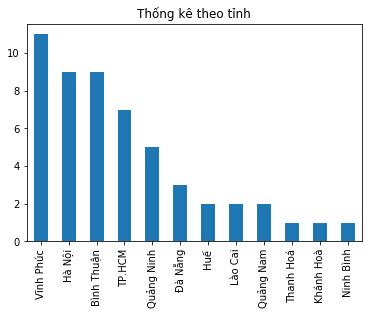

In [54]:
df1.plot(kind='bar', title='Thống kê theo tỉnh')

Text(0, 0.5, 'Tỉnh')

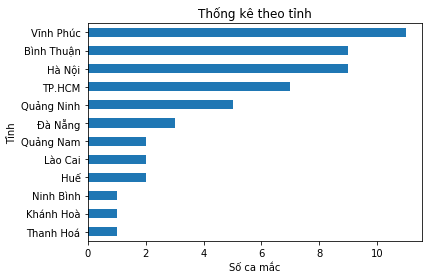

In [65]:
df1.sort_values(inplace = True)
ax = df1.plot(kind='barh', title='Thống kê theo tỉnh')
ax.set_xlabel('Số ca mắc')
ax.set_ylabel('Tỉnh')

## Thống kê theo quốc gia

In [130]:
df['Quốc tịch'].fillna('Việt Nam', inplace = True)

In [131]:
df2 = df['Quốc tịch'].value_counts()
df2

Việt Nam      37
Anh           11
Trung Quốc     2
Séc            1
Mỹ             1
Iceland        1
Name: Quốc tịch, dtype: int64

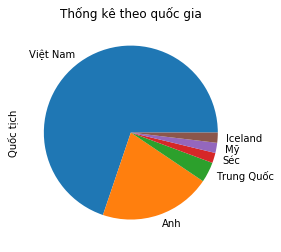

In [112]:
df2.plot(kind='pie', title='Thống kê theo quốc gia')

## Số ca ghi nhận theo thời gian

In [205]:
df.tail()

,Mã số BN,Tuổi,Giới tính,Quốc tịch,Nơi mắc,F,Hạng bay,Chuyến bay,Ngày mắc,Nơi điều trị,Ghi chú,Accumulative
48,BN49,71.0,Nam,Anh,Huế,F1,Thương gia,VN0054,2020-03-14,BV đa khoa TƯ Huế,TX BN30 vợ,49
49,BN50,50.0,Nam,Việt Nam,Hà Nội,F0,lãnh đạo VNA,NaN,2020-03-14,BV Bệnh nhiệt đới TƯ,Từ Pháp về,50
50,BN52,22.0,Nữ,Việt Nam,Hà Nội,F0,NaN,NaN,2020-03-14,BV Bệnh nhiệt đới TƯ,NaN,51
51,BN52,24.0,Nữ,Việt Nam,Quảng Ninh,F0,NaN,NaN,2020-03-14,BV dã chiến Quảng Ninh,NaN,52
52,BN53,53.0,Nam,Séc,TP.HCM,F0,NaN,NaN,2020-03-14,BV Bệnh nhiệt đới TP.HCM,NaN,53


In [206]:
df3 = pd.DataFrame(df['Ngày mắc'].value_counts().sort_index())

In [207]:
df3 = df3.cumsum()
# df3

In [208]:
idx = pd.date_range(min(df3.index), max(df3.index))

In [209]:
df3 = df3.reindex(idx, fill_value=0)

In [210]:
# df3

In [211]:
df3 = df3.replace(to_replace=0, method='ffill')

In [213]:
df3.tail()

,Ngày mắc
2020-03-10,34
2020-03-11,38
2020-03-12,44
2020-03-13,47
2020-03-14,53


In [214]:
import matplotlib.dates as mdates

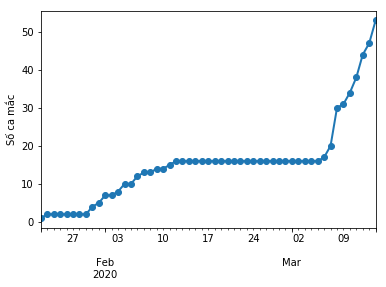

In [216]:
ax = df3.plot(linewidth=2, marker = 'o')
ax.set_ylabel('Số ca mắc')
# ax.xaxis.set_major_locator(mdates.DayLocator(interval=20))
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
ax.get_legend().remove()

#### To do: Plot các thành phần trên theo thời gian, cần tính accumulate theo time

# Map

In [217]:
df.head()

,Mã số BN,Tuổi,Giới tính,Quốc tịch,Nơi mắc,F,Hạng bay,Chuyến bay,Ngày mắc,Nơi điều trị,Ghi chú,Accumulative
0,BN01,66.0,Nam,Trung Quốc,TP.HCM,F0,NaN,NaN,2020-01-22,BV Chợ Rẫy,NaN,1
1,BN02,28.0,Nam,Trung Quốc,TP.HCM,F1,NaN,NaN,2020-01-23,BV Chợ Rẫy,NaN,2
2,BN03,25.0,Nữ,Việt Nam,Khánh Hoà,F1,NaN,NaN,2020-02-01,BV Nhiệt đới Khánh Hoà,NaN,3
3,BN04,25.0,Nữ,Việt Nam,Thanh Hoá,F0,NaN,NaN,2020-02-01,BV đa khoa Thanh Hoá,NaN,4
4,BN05,29.0,Nam,Việt Nam,Vĩnh Phúc,F0,NaN,NaN,2020-01-30,BV Bệnh nhiệt đới TƯ,NaN,5


In [232]:
df4 = df[df['Quốc tịch']=='Việt Nam']

In [233]:
df4.head()

,Mã số BN,Tuổi,Giới tính,Quốc tịch,Nơi mắc,F,Hạng bay,Chuyến bay,Ngày mắc,Nơi điều trị,Ghi chú,Accumulative
2,BN03,25.0,Nữ,Việt Nam,Khánh Hoà,F1,NaN,NaN,2020-02-01,BV Nhiệt đới Khánh Hoà,NaN,3
3,BN04,25.0,Nữ,Việt Nam,Thanh Hoá,F0,NaN,NaN,2020-02-01,BV đa khoa Thanh Hoá,NaN,4
4,BN05,29.0,Nam,Việt Nam,Vĩnh Phúc,F0,NaN,NaN,2020-01-30,BV Bệnh nhiệt đới TƯ,NaN,5
5,BN06,23.0,Nữ,Việt Nam,Vĩnh Phúc,F0,NaN,NaN,2020-01-30,BV Bệnh nhiệt đới TƯ,NaN,6
7,BN08,29.0,Nữ,Việt Nam,Vĩnh Phúc,F0,NaN,NaN,2020-02-03,BV Bệnh nhiệt đới TƯ,NaN,8


In [257]:
df5 = df4['Nơi mắc'].value_counts().rename_axis('province').reset_index(name='count')

In [280]:
df5.province = df5.province.replace(to_replace='Khánh Hoà', value='Khánh Hòa')
df5.province = df5.province.replace(to_replace='Thanh Hoá', value='Thanh Hóa')
df5.province = df5.province.replace(to_replace='TP.HCM', value='TP. Hồ Chí Minh')

In [282]:
df5

,province,count
0,Vĩnh Phúc,11
1,Hà Nội,9
2,Bình Thuận,9
3,TP. Hồ Chí Minh,3
4,Quảng Ninh,1
5,Thanh Hóa,1
6,Khánh Hòa,1
7,Ninh Bình,1
8,Đà Nẵng,1


In [311]:
state_geo = 'https://data.opendevelopmentmekong.net/dataset/999c96d8-fae0-4b82-9a2b-e481f6f50e12/resource/234169fb-ae73-4f23-bbd4-ff20a4fca401/download/diaphantinh.geojson'
# state_geo = 'https://raw.githubusercontent.com/nhohung/coronavirusmap/master/diaphantinh.geojson' # remove crs but turns out not necessary/

In [313]:
# possible tile: Mapbox Bright, stamenterrain, stamenwatercolor, cartodbpositron, cartodbdark_matter
m = folium.Map(location=[16, 106], tiles='cartodbpositron', zoom_start=5)
m.choropleth(
    geo_data=state_geo,
    data=df5,
    columns=['province', 'count'],
    key_on='feature.properties.ten_tinh',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0,
    legend_name='Number of cases',
#     highlight=True
)

m

Make other provinces zeros

In [315]:
import json, urllib

In [322]:
f = urllib.request.urlopen("https://data.opendevelopmentmekong.net/dataset/999c96d8-fae0-4b82-9a2b-e481f6f50e12/resource/234169fb-ae73-4f23-bbd4-ff20a4fca401/download/diaphantinh.geojson")
values = json.load(f)
f.close()

In [336]:
df6 = pd.DataFrame(columns=['province','count'])
for i in values['features']:
    df6 = df6.append({'province': i['properties']['ten_tinh'], 'count':0}, ignore_index=True)

In [375]:
for row in df5.iterrows():
    cty = row[1]['province']
    df6.loc[df6['province']==cty, 'count'] = row[1]['count']

In [380]:
import branca.colormap as cm


In [383]:
# possible tile: Mapbox Bright, stamenterrain, stamenwatercolor, cartodbpositron, cartodbdark_matter
m = folium.Map(location=[16, 106], tiles='cartodbpositron', zoom_start=5)
m.choropleth(
    geo_data=state_geo,
    data=df6,
    columns=['province', 'count'],
    key_on='feature.properties.ten_tinh',
    fill_color='Pastel1',
    fill_opacity=0.7,
    line_opacity=0,
    legend_name='Number of cases',
#     highlight=True
)

m

In [395]:
# possible tile: Mapbox Bright, stamenterrain, stamenwatercolor, cartodbpositron, cartodbdark_matter
bins = list(df6['count'].quantile([0, 0.25, 0.5, 0.75, 1]))

m = folium.Map(location=[16, 106], tiles='cartodbpositron', zoom_start=5)

m.choropleth(
    geo_data=state_geo,
    data=df6,
    columns=['province', 'count'],
    key_on='feature.properties.ten_tinh',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0,
    bins=bins,
    legend_name='Number of cases',
    reset=True
)

m

In [396]:
m.save('map.html')